In [1]:
import pandas as pd
from datetime import datetime
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
import seaborn as sns
import numpy as np

# Set figure size to (14,6)
plt.rcParams['figure.figsize'] = (14,6)


from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import KBinsDiscretizer
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import FunctionTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline, make_pipeline
import pandas as pd


#dropfirst = true OHE

In [2]:
df = pd.read_csv('TG_STAID002759.txt', 

usecols=[1,2], # we dont need id or the last row
skipfooter=1, # the last value of the rows is not needed
index_col=0, # put date as index
parse_dates=True) # set to date frame) #df.columns = df.columns.get_level_values(0)

C:\Users\alexp\anaconda3\lib\site-packages\pandas\util\_decorators.py:311: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support skipfooter; you can avoid this warning by specifying engine='python'.
  return func(*args, **kwargs)


In [3]:
df

,TG
DATE,
1876-01-01,22
1876-01-02,25
1876-01-03,3
1876-01-04,-58
1876-01-05,-98
...,...
2022-03-26,94
2022-03-27,97
2022-03-28,108


In [4]:
#df.columns = df.columns.to_flat_index()
#df.T.reset_index(drop=True).T

<AxesSubplot:ylabel='    DATE'>

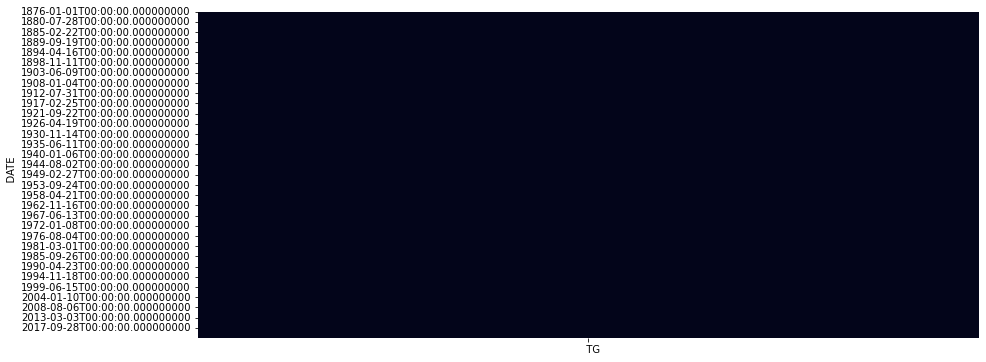

In [5]:
#null values?? 
sns.heatmap(df.isnull(), cbar=False)

In [6]:
df.columns

Index(['   TG'], dtype='object')

In [7]:
df['   TG'] = df['   TG'].apply(lambda x: x*0.1)

In [8]:
df

,TG
DATE,
1876-01-01,2.2
1876-01-02,2.5
1876-01-03,0.3
1876-01-04,-5.8
1876-01-05,-9.8
...,...
2022-03-26,9.4
2022-03-27,9.7
2022-03-28,10.8


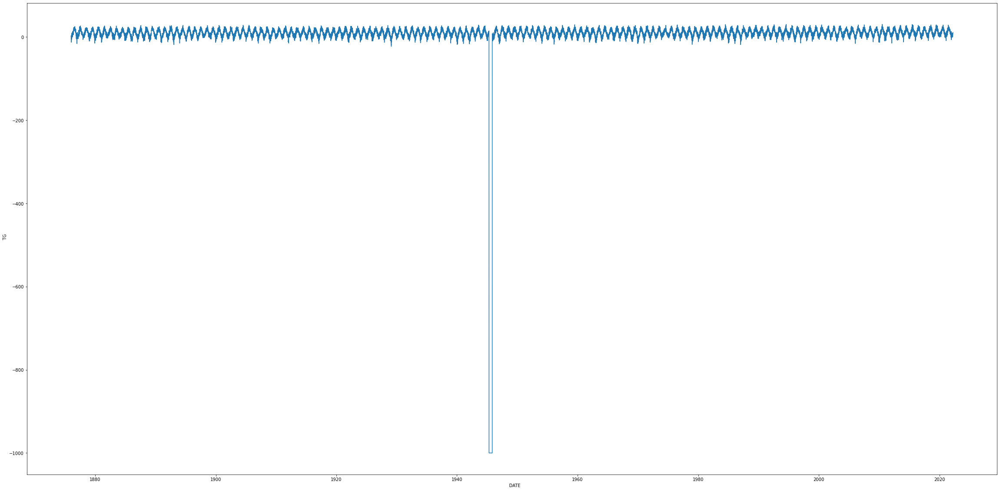

In [9]:
sns.lineplot(data=df, y='   TG', x=df.index)

# Change seaborn plot size
fig = plt.gcf()
fig.set_size_inches(40, 20) 

In [10]:
#deal with outliers
from scipy import stats

import numpy as np

In [11]:
df=df.rename(columns = {'   TG':'Temperatures'})

In [12]:
#df['   TG'][df['   TG'] <-100]= np.nan
#dataClean['temp'].replace(-9999, pd.NA , inplace=True) --> another way

In [13]:
#df.isna().sum()

In [14]:
#df.bfill(inplace = True)
df #kept showing footer for some reason? so put skip footer in the file import

,Temperatures
DATE,
1876-01-01,2.2
1876-01-02,2.5
1876-01-03,0.3
1876-01-04,-5.8
1876-01-05,-9.8
...,...
2022-03-26,9.4
2022-03-27,9.7
2022-03-28,10.8


In [15]:
df.isna().sum()

Temperatures    0
dtype: int64

In [16]:
#df[df['   TG']].mask(df[df['   TG']] <100 ,'0', inplace=True)  --> try with mask

In [17]:
df.loc['1945-04-25':'1945-11-05','Temperatures']=df.loc['1944-04-25':'1944-11-05','Temperatures'].values

In [18]:
df.loc['1945-04-25':'1945-11-05','Temperatures']

    DATE
1945-04-25    9.2
1945-04-26    9.2
1945-04-27    8.8
1945-04-28    8.6
1945-04-29    6.8
             ... 
1945-11-01    6.0
1945-11-02    5.4
1945-11-03    5.5
1945-11-04    7.2
1945-11-05    9.7
Name: Temperatures, Length: 195, dtype: float64

In [19]:
#indexNames = df.loc[df['   TG']<-50]

In [20]:
#df.bfill(df.iloc['1945-04-25', '1945-11-05']) --> try with using index positions

In [21]:
#df = df['   TG'].iloc[:,columns_idx].where(df.index.isin(indexNames)).bfill() --> try using where

In [22]:
# df['   TG'].mask(df['   TG'] < -100, np.nan, inplace=True) --> doesnt replace with nan ???

In [23]:
#df.query('Available == True')['Intensity'].fillna(0))

#df.loc[df['   TG'] < -50] = df.loc['   TG'].bfill()


#- use backfill (possible imputation)

##df[(np.abs(stats.zscore(df['   TG']) < 3).all)]

#df.drop(indexNames,inplace=True) - use backfill (possible imputation)

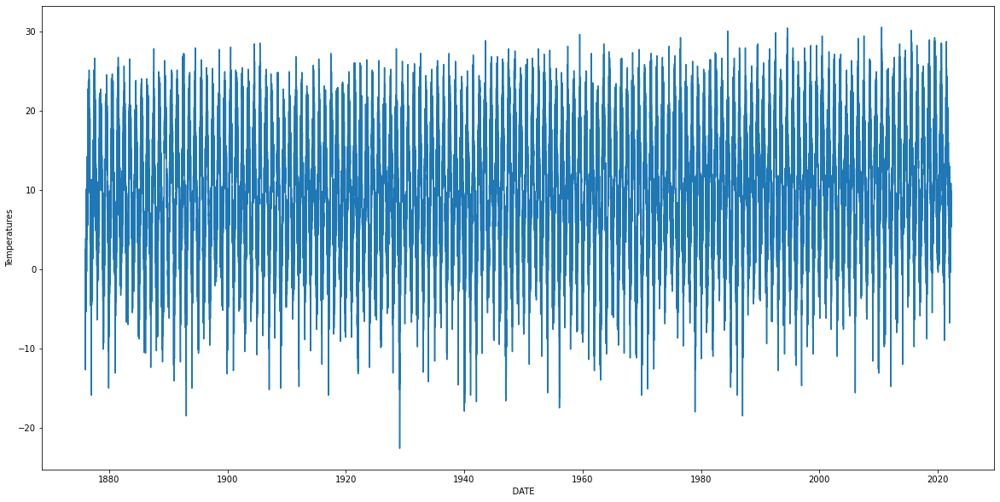

In [24]:
sns.lineplot(data=df, y='Temperatures', x=df.index)

# Change seaborn plot size
fig = plt.gcf()
fig.set_size_inches(20, 10) #basic plot

#df.plot() --> another way
#even though no NaN still slightly missing looking since backfill is low values in any case? 

In [25]:
#clean up col names and drop unecessary ones
#df.drop([' SOUID', ' Q_TG'], axis = 1, inplace = True)

In [26]:
df

,Temperatures
DATE,
1876-01-01,2.2
1876-01-02,2.5
1876-01-03,0.3
1876-01-04,-5.8
1876-01-05,-9.8
...,...
2022-03-26,9.4
2022-03-27,9.7
2022-03-28,10.8


In [27]:
df['new'] = df.index
df

,Temperatures,new
DATE,,
1876-01-01,2.2,1876-01-01
1876-01-02,2.5,1876-01-02
1876-01-03,0.3,1876-01-03
1876-01-04,-5.8,1876-01-04
1876-01-05,-9.8,1876-01-05
...,...,...
2022-03-26,9.4,2022-03-26
2022-03-27,9.7,2022-03-27
2022-03-28,10.8,2022-03-28


In [28]:
df['year'] = pd.DatetimeIndex(df['new']).year #.index.year is a quicker way (than making new col)

In [29]:
df['month'] = pd.DatetimeIndex(df['new']).month

In [30]:
df['day'] = pd.DatetimeIndex(df['new']).day

In [31]:
df.drop(['new'], axis = 1, inplace = True)

In [32]:
df

,Temperatures,year,month,day
DATE,,,,
1876-01-01,2.2,1876,1,1
1876-01-02,2.5,1876,1,2
1876-01-03,0.3,1876,1,3
1876-01-04,-5.8,1876,1,4
1876-01-05,-9.8,1876,1,5
...,...,...,...,...
2022-03-26,9.4,2022,3,26
2022-03-27,9.7,2022,3,27
2022-03-28,10.8,2022,3,28


In [33]:
# Create a timestep variable
#df['timestep'] = list(range(len(df)))
#df

In [34]:
#resample to do a trend based on monthly temps
df_ds = df.resample('M').mean().round()
df_ds

,Temperatures,year,month,day
DATE,,,,
1876-01-31,-2.0,1876.0,1.0,16.0
1876-02-29,2.0,1876.0,2.0,15.0
1876-03-31,5.0,1876.0,3.0,16.0
1876-04-30,10.0,1876.0,4.0,16.0
1876-05-31,10.0,1876.0,5.0,16.0
...,...,...,...,...
2021-11-30,7.0,2021.0,11.0,16.0
2021-12-31,2.0,2021.0,12.0,16.0
2022-01-31,4.0,2022.0,1.0,16.0


In [35]:
#resample to do it based on season
#df_dss = df.resample('S').mean()
#df_dss

In [36]:
# Create a timestep variable
df_ds['timestep'] = list(range(len(df_ds)))
df_ds

,Temperatures,year,month,day,timestep
DATE,,,,,
1876-01-31,-2.0,1876.0,1.0,16.0,0
1876-02-29,2.0,1876.0,2.0,15.0,1
1876-03-31,5.0,1876.0,3.0,16.0,2
1876-04-30,10.0,1876.0,4.0,16.0,3
1876-05-31,10.0,1876.0,5.0,16.0,4
...,...,...,...,...,...
2021-11-30,7.0,2021.0,11.0,16.0,1750
2021-12-31,2.0,2021.0,12.0,16.0,1751
2022-01-31,4.0,2022.0,1.0,16.0,1752


In [37]:
# Run a Linear Regression
m = LinearRegression()
X = df_ds[['timestep']]
y = df_ds['Temperatures']
m.fit(X, y)

LinearRegression()

In [38]:
df_ds['trend'] = m.predict(X)

<AxesSubplot:xlabel='    DATE'>

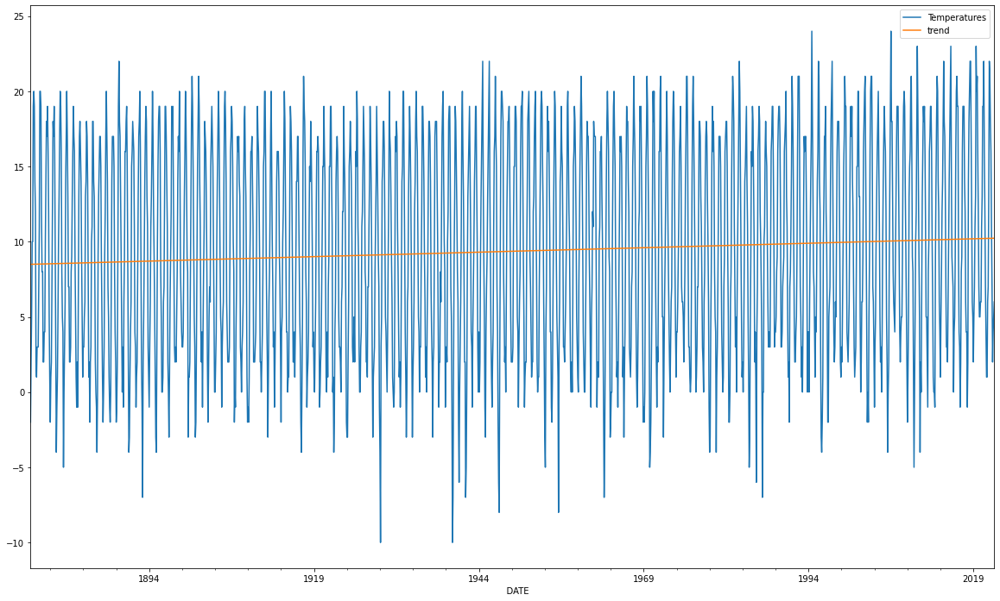

In [39]:
df_ds[['Temperatures', 'trend']].plot(figsize=(20, 12)) #trend per month

In [40]:
pd.get_dummies(df_ds.index.month, prefix='month').set_index(df_ds.index)

,month_1,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
DATE,,,,,,,,,,,,
1876-01-31,1,0,0,0,0,0,0,0,0,0,0,0
1876-02-29,0,1,0,0,0,0,0,0,0,0,0,0
1876-03-31,0,0,1,0,0,0,0,0,0,0,0,0
1876-04-30,0,0,0,1,0,0,0,0,0,0,0,0
1876-05-31,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...
2021-11-30,0,0,0,0,0,0,0,0,0,0,1,0
2021-12-31,0,0,0,0,0,0,0,0,0,0,0,1
2022-01-31,1,0,0,0,0,0,0,0,0,0,0,0


In [41]:
# One-Hot-Encoding the month
seasonal_dummies = pd.get_dummies(df.index.month,
                                  prefix='month',
                                  drop_first=True).set_index(df.index) #prefix renames and underscores mnth number (drop 1st)
# sklearn.preprocessing.OneHotEncoder - drop 1st col bc redundant info

df = df.join(seasonal_dummies) 

In [42]:
df 

,Temperatures,year,month,day,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12
DATE,,,,,,,,,,,,,,,
1876-01-01,2.2,1876,1,1,0,0,0,0,0,0,0,0,0,0,0
1876-01-02,2.5,1876,1,2,0,0,0,0,0,0,0,0,0,0,0
1876-01-03,0.3,1876,1,3,0,0,0,0,0,0,0,0,0,0,0
1876-01-04,-5.8,1876,1,4,0,0,0,0,0,0,0,0,0,0,0
1876-01-05,-9.8,1876,1,5,0,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-26,9.4,2022,3,26,0,1,0,0,0,0,0,0,0,0,0
2022-03-27,9.7,2022,3,27,0,1,0,0,0,0,0,0,0,0,0
2022-03-28,10.8,2022,3,28,0,1,0,0,0,0,0,0,0,0,0


In [43]:
# Define X and y
X = df.drop(columns=['day', 'year', 'month', 'Temperatures'])
y = df['Temperatures']

In [44]:
m.fit(X, y)

LinearRegression()

In [45]:
y.isna().any()

False

In [46]:
df['trend_seasonal'] = m.predict(X)
df

,Temperatures,year,month,day,month_2,month_3,month_4,month_5,month_6,month_7,month_8,month_9,month_10,month_11,month_12,trend_seasonal
DATE,,,,,,,,,,,,,,,,
1876-01-01,2.2,1876,1,1,0,0,0,0,0,0,0,0,0,0,0,0.019816
1876-01-02,2.5,1876,1,2,0,0,0,0,0,0,0,0,0,0,0,0.019816
1876-01-03,0.3,1876,1,3,0,0,0,0,0,0,0,0,0,0,0,0.019816
1876-01-04,-5.8,1876,1,4,0,0,0,0,0,0,0,0,0,0,0,0.019816
1876-01-05,-9.8,1876,1,5,0,0,0,0,0,0,0,0,0,0,0,0.019816
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-03-26,9.4,2022,3,26,0,1,0,0,0,0,0,0,0,0,0,4.192735
2022-03-27,9.7,2022,3,27,0,1,0,0,0,0,0,0,0,0,0,4.192735
2022-03-28,10.8,2022,3,28,0,1,0,0,0,0,0,0,0,0,0,4.192735


<AxesSubplot:xlabel='    DATE'>

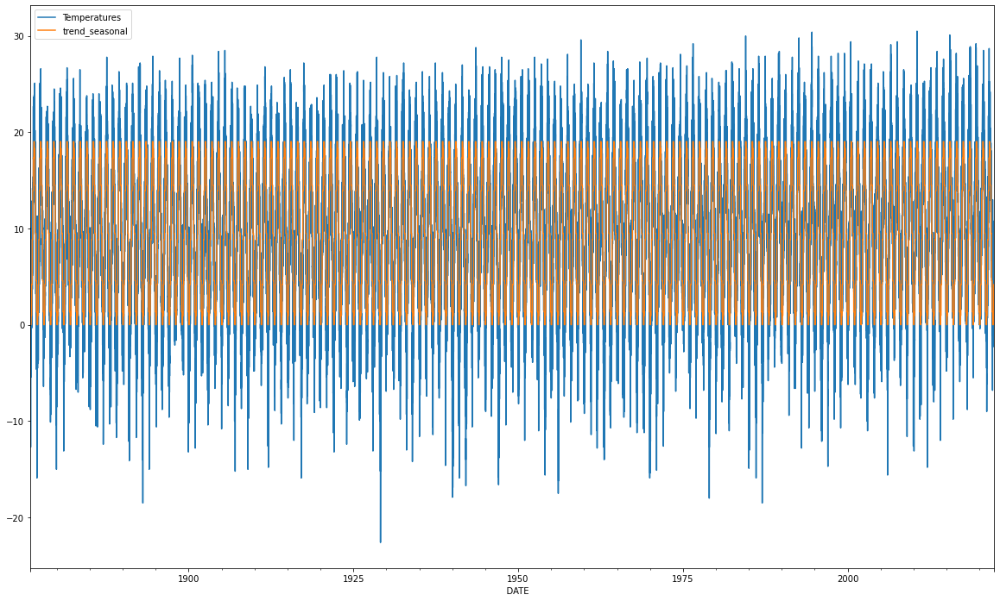

In [47]:
df[['Temperatures', 'trend_seasonal']].plot(figsize=(20, 12))

In [48]:
# We want to extract the part of the model that the trend_seasonal is not able to explain
df['remainder'] = df['Temperatures'] - df['trend_seasonal']

In [49]:
#plotly
 #this is the residual not based on the constants (passing of times and cyclicals)- is this how we get stationarity??
import plotly.express as pl
pl.line(df['remainder'])

In [50]:
#determine stationarity --> augmented dicky fuller test 



In [51]:
#check for autocorr
df['lag1'] = df['remainder'].shift(1)

In [52]:
df1 = df[['remainder', 'lag1']]

In [53]:
df1.corr()

,remainder,lag1
remainder,1.000000,0.807147
lag1,0.807147,1.000000


In [54]:
#df1['lag2'] = df1['remainder'].shift(2)

In [55]:
#df1.corr()

In [56]:
from statsmodels.graphics.tsaplots import plot_pacf, plot_acf
from statsmodels.tsa.ar_model import ar_select_order, AutoReg

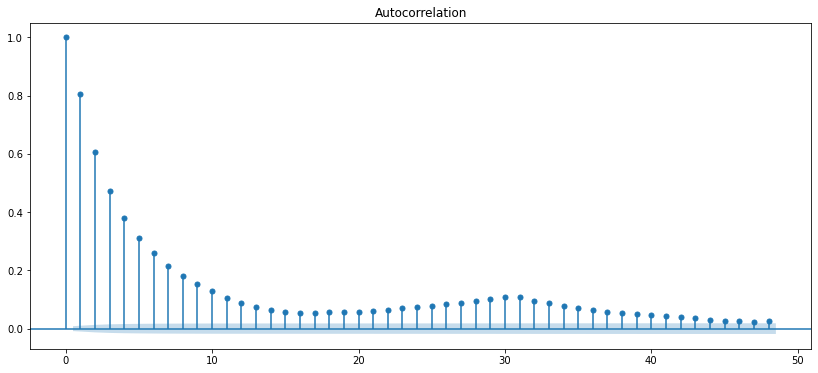

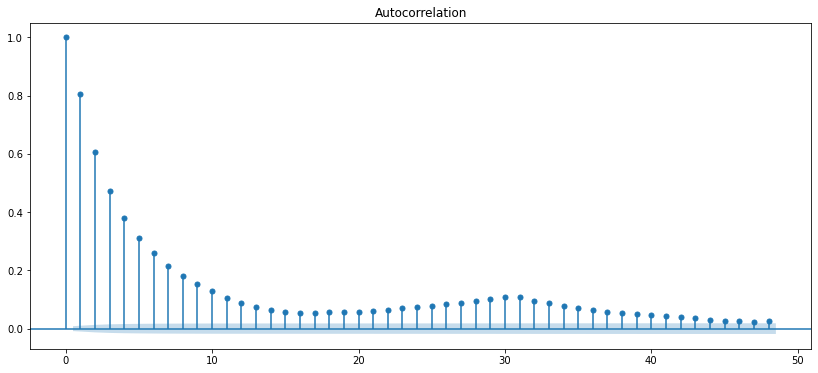

In [57]:
#detect stationarity
plot_acf(df1['remainder']) #background is 5% sig level

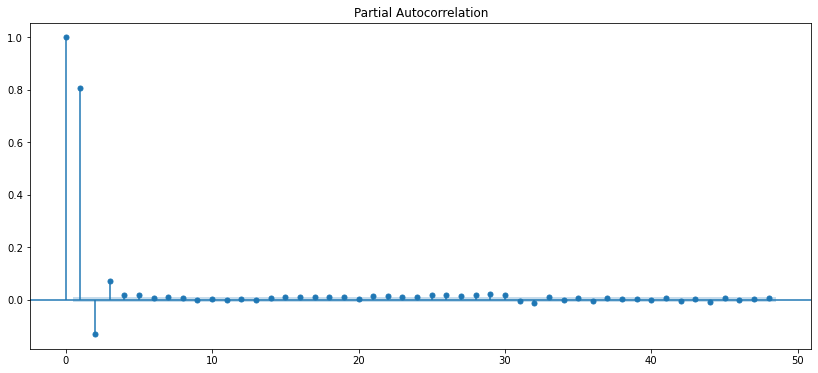

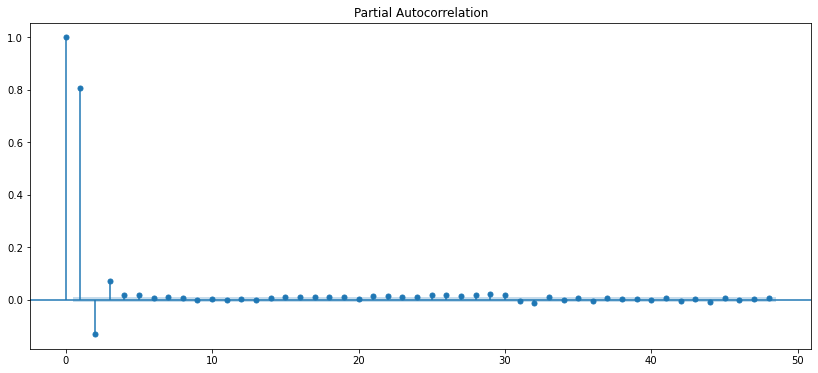

In [58]:
#detect stationarity
plot_pacf(df1['remainder']) 

In [59]:
#if ACF gradual and PACF instant (as above) use autoregressive

#train linreg using lag to predict future remainder (autoreg)

ar_order = ar_select_order(df['remainder'], maxlag = 12)

C:\Users\alexp\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\alexp\anaconda3\lib\site-packages\statsmodels\tsa\ar_model.py:248: FutureWarning:

The parameter names will change after 0.12 is released. Set old_names to False to use the new names now. Set old_names to True to use the old names. 

C:\Users\alexp\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



In [60]:
ar_order.ar_lags #markdown file says based on which conditions what should happen:#ACF gradual and PACF instant (as above) use autoregressive 

#box jenkins: how to read maps, and how to select lags... 

array([1, 2, 3, 4, 5])

In [63]:
from statsmodels.tsa.ar_model import AutoReg
from random import random

out = 'AIC: {0:0.3f}, HQIC: {1:0.3f}, BIC: {2:0.3f}'

In [77]:
res = AutoReg(df['Temperatures'], lags = [1, 11, 12]).fit()
print(out.format(res.aic, res.hqic, res.bic)) #unrestricted seasonal (didnt put seasonal true)

AIC: 1.686, HQIC: 1.687, BIC: 1.687


C:\Users\alexp\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.

C:\Users\alexp\anaconda3\lib\site-packages\statsmodels\tsa\ar_model.py:248: FutureWarning:

The parameter names will change after 0.12 is released. Set old_names to False to use the new names now. Set old_names to True to use the old names. 

C:\Users\alexp\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:132: FutureWarning:

The 'freq' argument in Timestamp is deprecated and will be removed in a future version.



In [74]:
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               AutoReg Model Results                                
====================================================================================
Dep. Variable:                 Temperatures   No. Observations:                53415
Model:             Restr. Seas. AutoReg(12)   Log Likelihood             -120794.680
Method:                     Conditional MLE   S.D. of innovations              2.323
Date:                      Fri, 29 Apr 2022   AIC                              1.687
Time:                              14:41:59   BIC                              1.689
Sample:                          01-13-1876   HQIC                             1.687
                               - 03-30-2022                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
intercept            0.2525      0.036      7.073      0.000       0.183       0.322
seasonal.1           0.0276      0.047      0.586      0.558      -0.065       0.120
seasonal.2           0.0605      0.047      1.284      0.199      -0.032       0.153
seasonal.3           0.0328      0.047      0.696      0.486      -0.060       0.125
seasonal.4          -0.0443      0.047     -0.940      0.347      -0.137       0.048
seasonal.5          -0.0326      0.047     -0.691      0.490      -0.125       0.060
seasonal.6           0.0394      0.047      0.836      0.403      -0.053       0.132
seasonal.7           0.0189      0.047      0.401      0.688      -0.074       0.111
seasonal.8           0.0174      0.047      0.369      0.712      -0.075       0.110
seasonal.9           0.0175      0.047      0.371      0.711      -0.075       0.110
seasonal.10          0.0133      0.047      0.282      0.778      -0.079       0.106
Temperatures.L1      0.8889      0.002    420.957      0.000       0.885       0.893
Temperatures.L11     0.0426      0.004      9.716      0.000       0.034       0.051
Temperatures.L12     0.0402      0.004      9.310      0.000       0.032       0.049
                                    Roots                                     
==============================================================================
                   Real          Imaginary           Modulus         Frequency
------------------------------------------------------------------------------
AR.1             1.0147           -0.0000j            1.0147           -0.0000
AR.2             1.0537           -0.4730j            1.1550           -0.0672
AR.3             1.0537           +0.4730j            1.1550            0.0672
AR.4             0.6931           -1.0473j            1.2559           -0.1570
AR.5             0.6931           +1.0473j            1.2559            0.1570
AR.6             0.0233           -1.3256j            1.3258           -0.2472
AR.7             0.0233           +1.3256j            1.3258            0.2472
AR.8            -0.7223           -1.1943j            1.3957           -0.3366
AR.9            -0.7223           +1.1943j            1.3957            0.3366
AR.10           -1.5463           -0.0000j            1.5463           -0.5000
AR.11           -1.3111           -0.6916j            1.4824           -0.4227
AR.12           -1.3111           +0.6916j            1.4824            0.4227
------------------------------------------------------------------------------
"""

In [65]:
res = AutoReg(df['Temperatures'], lags=5, seasonal=True, period=11).fit()
print(out.format(res.aic, res.hqic, res.bic)) #seasonal dummies

AIC: 1.671, HQIC: 1.672, BIC: 1.674


C:\Users\alexp\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



In [75]:
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               AutoReg Model Results                                
====================================================================================
Dep. Variable:                 Temperatures   No. Observations:                53415
Model:             Restr. Seas. AutoReg(12)   Log Likelihood             -120794.680
Method:                     Conditional MLE   S.D. of innovations              2.323
Date:                      Fri, 29 Apr 2022   AIC                              1.687
Time:                              14:42:21   BIC                              1.689
Sample:                          01-13-1876   HQIC                             1.687
                               - 03-30-2022                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
intercept            0.2525      0.036      7.073      0.000       0.183       0.322
seasonal.1           0.0276      0.047      0.586      0.558      -0.065       0.120
seasonal.2           0.0605      0.047      1.284      0.199      -0.032       0.153
seasonal.3           0.0328      0.047      0.696      0.486      -0.060       0.125
seasonal.4          -0.0443      0.047     -0.940      0.347      -0.137       0.048
seasonal.5          -0.0326      0.047     -0.691      0.490      -0.125       0.060
seasonal.6           0.0394      0.047      0.836      0.403      -0.053       0.132
seasonal.7           0.0189      0.047      0.401      0.688      -0.074       0.111
seasonal.8           0.0174      0.047      0.369      0.712      -0.075       0.110
seasonal.9           0.0175      0.047      0.371      0.711      -0.075       0.110
seasonal.10          0.0133      0.047      0.282      0.778      -0.079       0.106
Temperatures.L1      0.8889      0.002    420.957      0.000       0.885       0.893
Temperatures.L11     0.0426      0.004      9.716      0.000       0.034       0.051
Temperatures.L12     0.0402      0.004      9.310      0.000       0.032       0.049
                                    Roots                                     
==============================================================================
                   Real          Imaginary           Modulus         Frequency
------------------------------------------------------------------------------
AR.1             1.0147           -0.0000j            1.0147           -0.0000
AR.2             1.0537           -0.4730j            1.1550           -0.0672
AR.3             1.0537           +0.4730j            1.1550            0.0672
AR.4             0.6931           -1.0473j            1.2559           -0.1570
AR.5             0.6931           +1.0473j            1.2559            0.1570
AR.6             0.0233           -1.3256j            1.3258           -0.2472
AR.7             0.0233           +1.3256j            1.3258            0.2472
AR.8            -0.7223           -1.1943j            1.3957           -0.3366
AR.9            -0.7223           +1.1943j            1.3957            0.3366
AR.10           -1.5463           -0.0000j            1.5463           -0.5000
AR.11           -1.3111           -0.6916j            1.4824           -0.4227
AR.12           -1.3111           +0.6916j            1.4824            0.4227
------------------------------------------------------------------------------
"""

In [81]:
res = AutoReg(df['Temperatures'], lags=4, seasonal=True, period=11).fit()
print(out.format(res.aic, res.hqic, res.bic)) #seasonal dummies

AIC: 1.678, HQIC: 1.679, BIC: 1.681


C:\Users\alexp\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



In [66]:
res = AutoReg(df['Temperatures'], lags=[1, 11, 12], seasonal=True, period=11).fit()
print(out.format(res.aic, res.hqic, res.bic)) #AR structure and dummies -- same as unrestricted seasonal

AIC: 1.687, HQIC: 1.687, BIC: 1.689


C:\Users\alexp\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



In [76]:
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               AutoReg Model Results                                
====================================================================================
Dep. Variable:                 Temperatures   No. Observations:                53415
Model:             Restr. Seas. AutoReg(12)   Log Likelihood             -120794.680
Method:                     Conditional MLE   S.D. of innovations              2.323
Date:                      Fri, 29 Apr 2022   AIC                              1.687
Time:                              14:42:37   BIC                              1.689
Sample:                          01-13-1876   HQIC                             1.687
                               - 03-30-2022                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
intercept            0.2525      0.036      7.073      0.000       0.183       0.322
seasonal.1           0.0276      0.047      0.586      0.558      -0.065       0.120
seasonal.2           0.0605      0.047      1.284      0.199      -0.032       0.153
seasonal.3           0.0328      0.047      0.696      0.486      -0.060       0.125
seasonal.4          -0.0443      0.047     -0.940      0.347      -0.137       0.048
seasonal.5          -0.0326      0.047     -0.691      0.490      -0.125       0.060
seasonal.6           0.0394      0.047      0.836      0.403      -0.053       0.132
seasonal.7           0.0189      0.047      0.401      0.688      -0.074       0.111
seasonal.8           0.0174      0.047      0.369      0.712      -0.075       0.110
seasonal.9           0.0175      0.047      0.371      0.711      -0.075       0.110
seasonal.10          0.0133      0.047      0.282      0.778      -0.079       0.106
Temperatures.L1      0.8889      0.002    420.957      0.000       0.885       0.893
Temperatures.L11     0.0426      0.004      9.716      0.000       0.034       0.051
Temperatures.L12     0.0402      0.004      9.310      0.000       0.032       0.049
                                    Roots                                     
==============================================================================
                   Real          Imaginary           Modulus         Frequency
------------------------------------------------------------------------------
AR.1             1.0147           -0.0000j            1.0147           -0.0000
AR.2             1.0537           -0.4730j            1.1550           -0.0672
AR.3             1.0537           +0.4730j            1.1550            0.0672
AR.4             0.6931           -1.0473j            1.2559           -0.1570
AR.5             0.6931           +1.0473j            1.2559            0.1570
AR.6             0.0233           -1.3256j            1.3258           -0.2472
AR.7             0.0233           +1.3256j            1.3258            0.2472
AR.8            -0.7223           -1.1943j            1.3957           -0.3366
AR.9            -0.7223           +1.1943j            1.3957            0.3366
AR.10           -1.5463           -0.0000j            1.5463           -0.5000
AR.11           -1.3111           -0.6916j            1.4824           -0.4227
AR.12           -1.3111           +0.6916j            1.4824            0.4227
------------------------------------------------------------------------------
"""

In [78]:
res = AutoReg(df['Temperatures'], lags=[5, 11, 12], seasonal=True, period=11).fit()
print(out.format(res.aic, res.hqic, res.bic)) #AR structure and dummies -- same as unrestricted seasonal

AIC: 2.820, HQIC: 2.820, BIC: 2.822


C:\Users\alexp\anaconda3\lib\site-packages\statsmodels\tsa\base\tsa_model.py:524: ValueWarning:

No frequency information was provided, so inferred frequency D will be used.



In [79]:
res.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                               AutoReg Model Results                                
====================================================================================
Dep. Variable:                 Temperatures   No. Observations:                53415
Model:             Restr. Seas. AutoReg(12)   Log Likelihood             -151048.914
Method:                     Conditional MLE   S.D. of innovations              4.094
Date:                      Fri, 29 Apr 2022   AIC                              2.820
Time:                              15:14:26   BIC                              2.822
Sample:                          01-13-1876   HQIC                             2.820
                               - 03-30-2022                                         
====================================================================================
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
intercept            1.0077      0.063     16.037      0.000       0.885       1.131
seasonal.1           0.0115      0.083      0.139      0.889      -0.151       0.174
seasonal.2           0.0485      0.083      0.584      0.559      -0.114       0.211
seasonal.3           0.0538      0.083      0.647      0.517      -0.109       0.217
seasonal.4          -0.0016      0.083     -0.019      0.985      -0.164       0.161
seasonal.5          -0.0246      0.083     -0.296      0.767      -0.187       0.138
seasonal.6          -0.0024      0.083     -0.029      0.977      -0.165       0.160
seasonal.7          -0.0302      0.083     -0.363      0.716      -0.193       0.133
seasonal.8          -0.0383      0.083     -0.461      0.644      -0.201       0.125
seasonal.9           0.0007      0.083      0.008      0.993      -0.162       0.164
seasonal.10          0.0283      0.083      0.341      0.733      -0.135       0.191
Temperatures.L5      0.5812      0.004    144.444      0.000       0.573       0.589
Temperatures.L11     0.1574      0.008     20.136      0.000       0.142       0.173
Temperatures.L12     0.1542      0.008     20.231      0.000       0.139       0.169
                                    Roots                                     
==============================================================================
                   Real          Imaginary           Modulus         Frequency
------------------------------------------------------------------------------
AR.1             1.0156           -0.0000j            1.0156           -0.0000
AR.2             1.0384           -0.5889j            1.1938           -0.0821
AR.3             1.0384           +0.5889j            1.1938            0.0821
AR.4             0.4187           -0.9669j            1.0536           -0.1850
AR.5             0.4187           +0.9669j            1.0536            0.1850
AR.6             0.0320           -1.1840j            1.1844           -0.2457
AR.7             0.0320           +1.1840j            1.1844            0.2457
AR.8            -0.8149           -0.9326j            1.2385           -0.3643
AR.9            -0.8149           +0.9326j            1.2385            0.3643
AR.10           -0.9546           -0.6001j            1.1276           -0.4107
AR.11           -0.9546           +0.6001j            1.1276            0.4107
AR.12           -1.4757           -0.0000j            1.4757           -0.5000
------------------------------------------------------------------------------
"""

In [67]:
#np.mean(temp_df.diff(1).diff(365)) --> to check for stationarity for using ARIMA 

## stationarity so not a func of time (log col for ARIMA? or for autoreg?????)
#np.log(y).diff(1).diff(12)
# .plot()

In [68]:
pip install fbprophet

  Using cached fbprophet-0.7.1.tar.gz (64 kB)
  Running setup.py clean for fbprophet
Failed to build fbprophet
    Running setup.py install for fbprophet: started
    Running setup.py install for fbprophet: finished with status 'error'
Note: you may need to restart the kernel to use updated packages.


  ERROR: Command errored out with exit status 1:
   command: 'C:\Users\alexp\anaconda3\python.exe' -u -c 'import io, os, sys, setuptools, tokenize; sys.argv[0] = '"'"'C:\\Users\\alexp\\AppData\\Local\\Temp\\pip-install-5ju05ly_\\fbprophet_f04d6eca3c8f46d39b05bd66f887cb09\\setup.py'"'"'; __file__='"'"'C:\\Users\\alexp\\AppData\\Local\\Temp\\pip-install-5ju05ly_\\fbprophet_f04d6eca3c8f46d39b05bd66f887cb09\\setup.py'"'"';f = getattr(tokenize, '"'"'open'"'"', open)(__file__) if os.path.exists(__file__) else io.StringIO('"'"'from setuptools import setup; setup()'"'"');code = f.read().replace('"'"'\r\n'"'"', '"'"'\n'"'"');f.close();exec(compile(code, __file__, '"'"'exec'"'"'))' bdist_wheel -d 'C:\Users\alexp\AppData\Local\Temp\pip-wheel-l43e8bho'
       cwd: C:\Users\alexp\AppData\Local\Temp\pip-install-5ju05ly_\fbprophet_f04d6eca3c8f46d39b05bd66f887cb09\
  Complete output (10 lines):
  running bdist_wheel
  running build
  running build_py
  creating build
  creating build\lib
  creating bu

In [69]:
#from prophet import prophet
#m = Prophet()
#m.fit(df)
df.columns #do I need five lags though? 

Index(['Temperatures', 'year', 'month', 'day', 'month_2', 'month_3', 'month_4',
       'month_5', 'month_6', 'month_7', 'month_8', 'month_9', 'month_10',
       'month_11', 'month_12', 'trend_seasonal', 'remainder', 'lag1'],
      dtype='object')

In [ ]:
#model to test forecasting (train, test, split)
X= 
y= 

In [72]:
m_sl = LinearRegression()

In [73]:
m_sl.fit(X_sl, y_sl)
#something wrong with values?? 

LinearRegression()

In [ ]:
#ARIMA : diff (1).diff(365) (remove trend, yearly) -> ??, lag 5 (optimal amount found through acf and pacf above)

